In [1]:
import scanpy as sc
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import progeny

sc.set_figure_params(figsize=(4, 4))

In [2]:
adata = sc.read_h5ad("../../data/30_merge_adata/adata_scvi.h5ad")

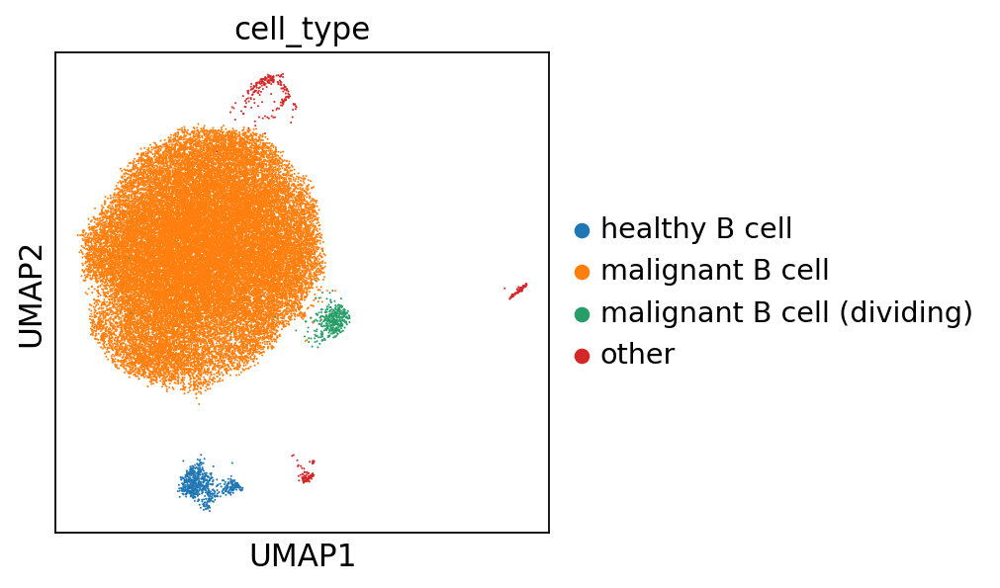

In [3]:
sc.pl.umap(adata, color="cell_type")

In [4]:
adata = adata[adata.obs["cell_type"] == "malignant B cell", :]

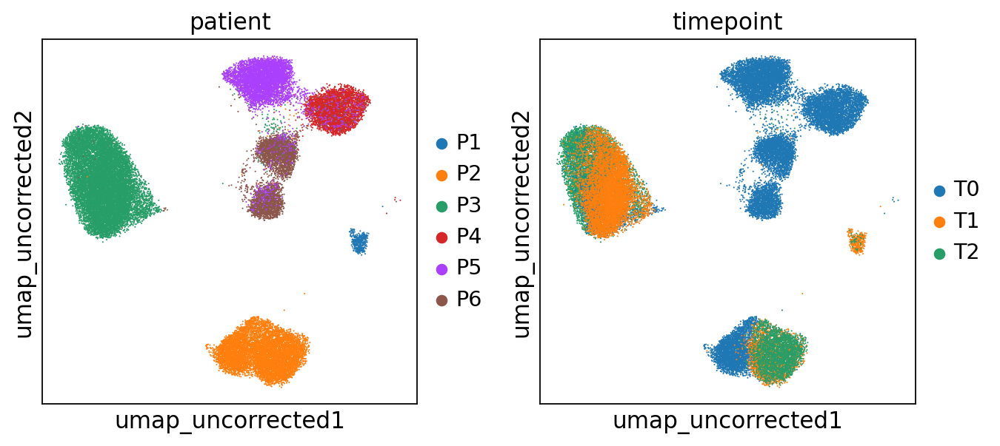

In [5]:
sc.pl.embedding(adata, "umap_uncorrected", color=["patient", "timepoint"])

P1


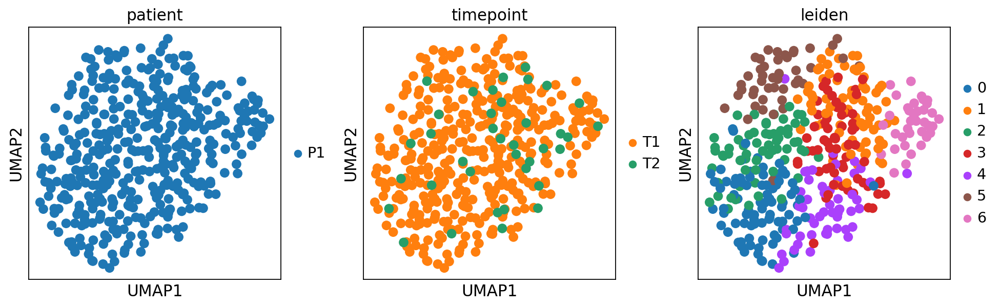

P2


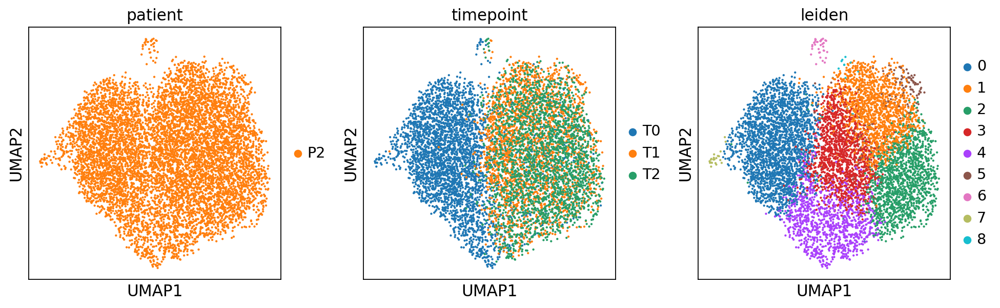

P3


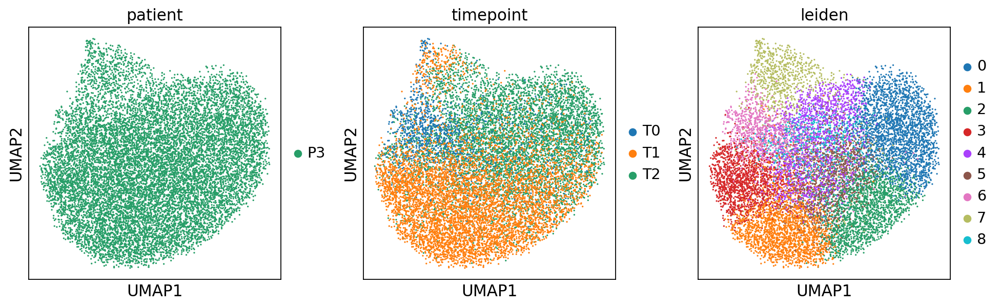

P4


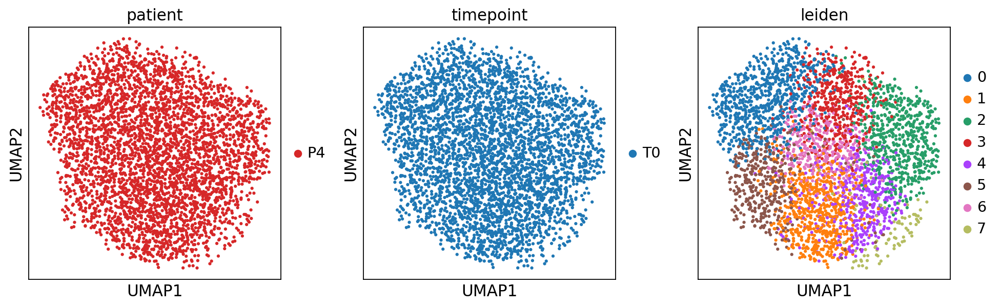

P5


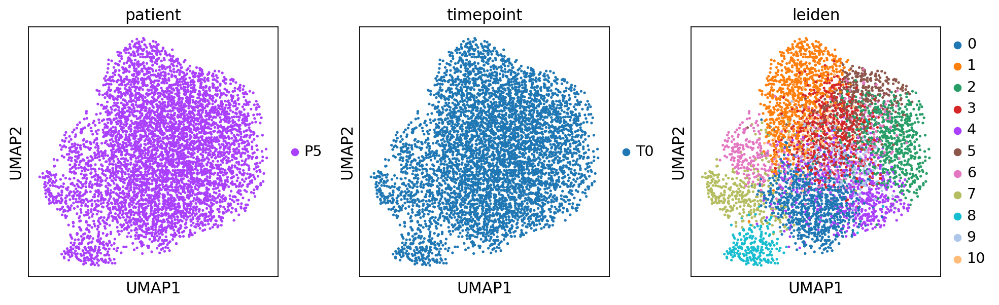

P6


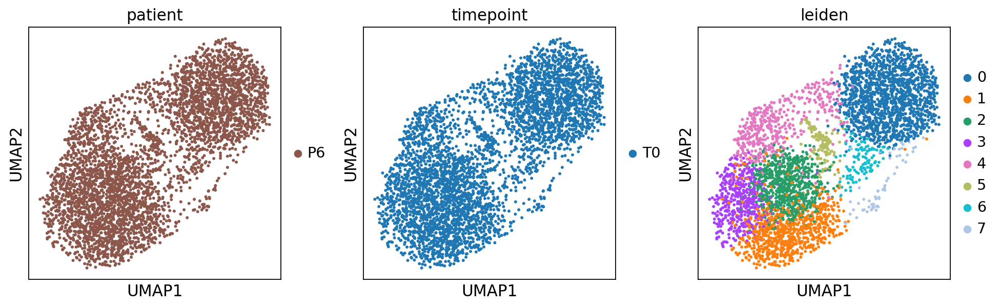

In [8]:
patient_adatas = dict()
# for patient in ["P1", "P2", "P3"]:
for patient in adata.obs["patient"].sort_values().unique():
    print(patient)
    tmp_adata = adata[adata.obs["patient"] == patient, :].copy()
#     progeny.run(tmp_adata, scale=True)
#     for col in tmp_adata.obsm["progeny"].columns:
#         tmp_adata.obs[f"PW:{col}"] = tmp_adata.obsm["progeny"][col]
    sc.tl.pca(tmp_adata)
    sc.pp.neighbors(tmp_adata)
    sc.tl.umap(tmp_adata)
    sc.tl.leiden(tmp_adata, resolution=1)
    sc.pl.umap(tmp_adata, color=["patient", "timepoint", "leiden"], ncols=4)
    patient_adatas[patient] = tmp_adata

In [9]:
for patient, tmp_adata in patient_adatas.items():
    tmp_adata.write_h5ad(f"../../data/60_cluster_analysis/60_adata_{patient}.h5ad")

In [10]:
for tmp_adata in patient_adatas.values():
    sc.tl.rank_genes_groups(tmp_adata, method="wilcoxon", groupby="leiden")

It appears that in all patients, there is a cluster that is FOSB+/JUN+/DUSP1+.

P1


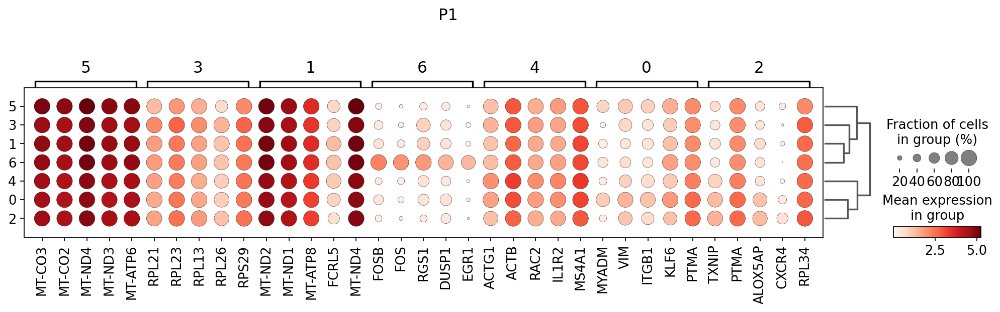

P2


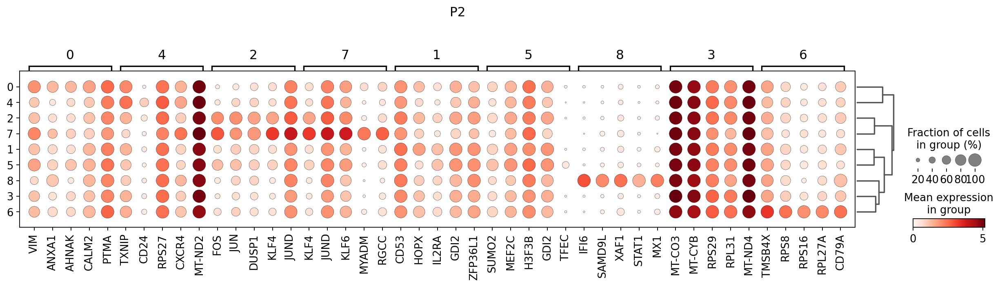

P3


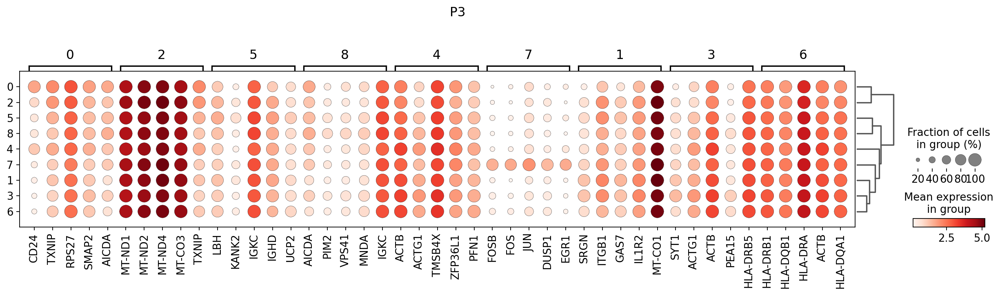

P4


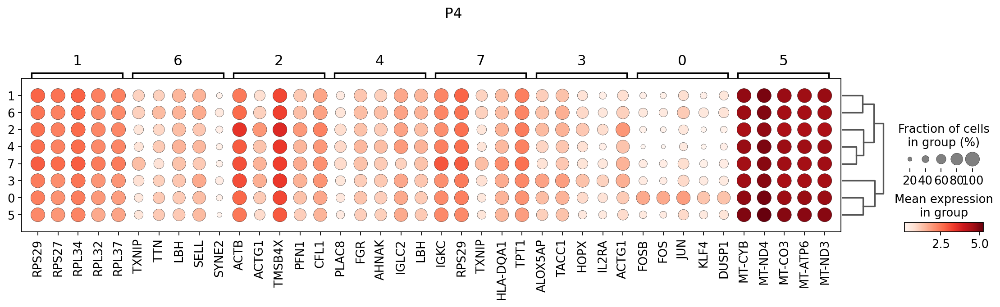

P5


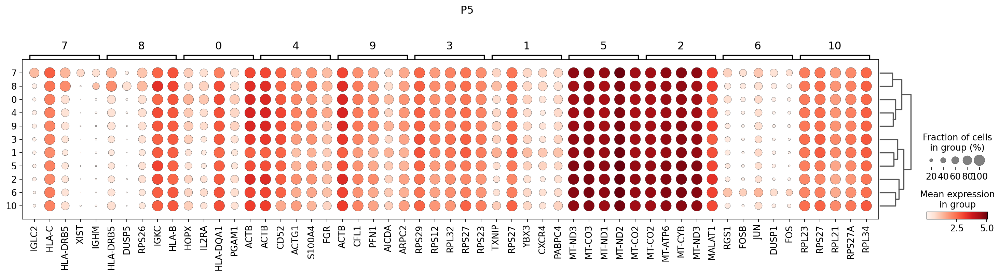

P6


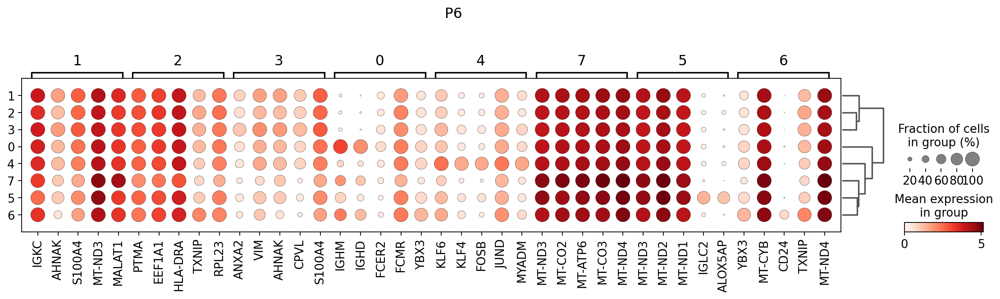

In [11]:
for tmp_patient, tmp_adata in patient_adatas.items():
    print(tmp_patient)
    sc.pl.rank_genes_groups_dotplot(tmp_adata, n_genes=5, title=tmp_patient)

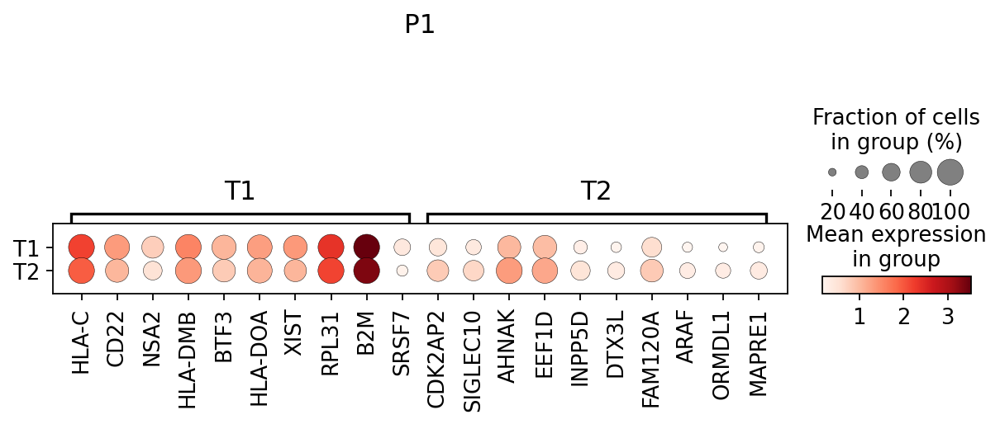

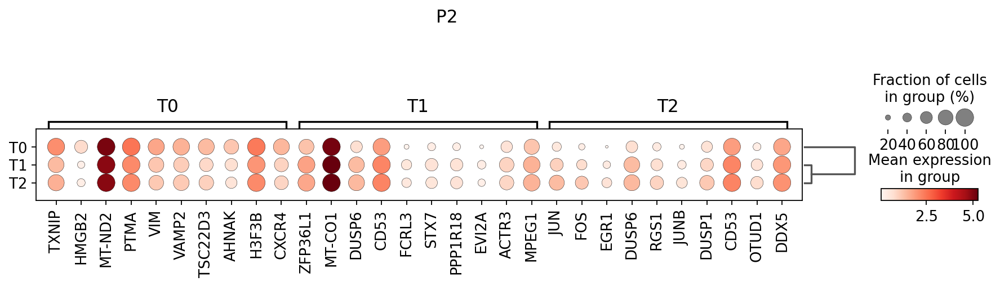

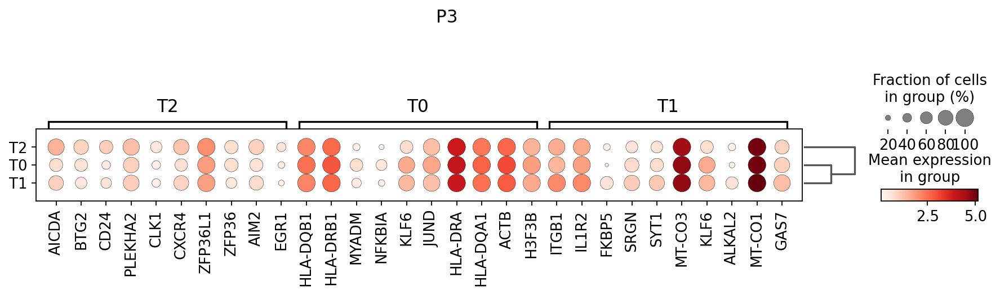

In [12]:
for tmp_patient in ["P1", "P2", "P3"]:
    tmp_adata = patient_adatas[tmp_patient]
    sc.tl.rank_genes_groups(tmp_adata, method="wilcoxon", groupby="timepoint")
    sc.pl.rank_genes_groups_dotplot(tmp_adata, n_genes=10, title=tmp_patient)

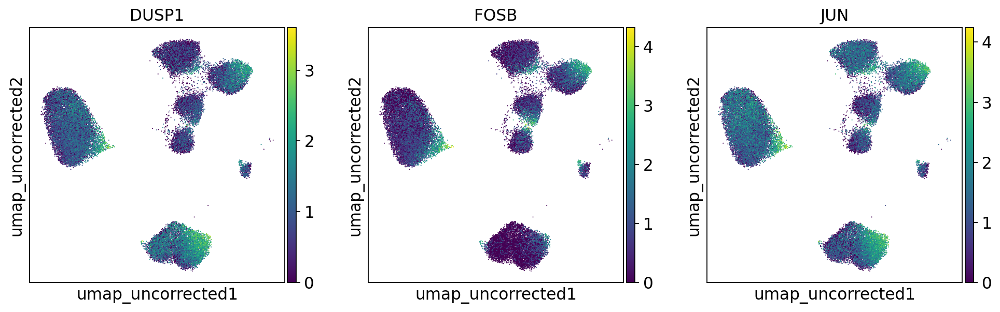

In [13]:
sc.pl.embedding(adata, "umap_uncorrected", color=["DUSP1", "FOSB", "JUN"])

P1


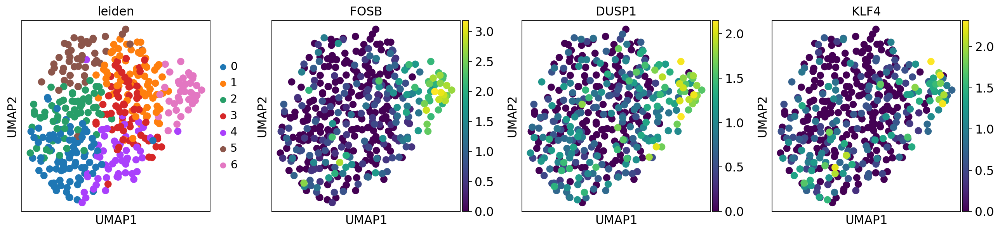

P2


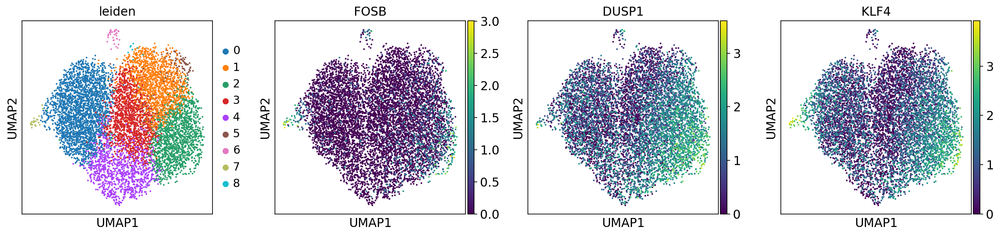

P3


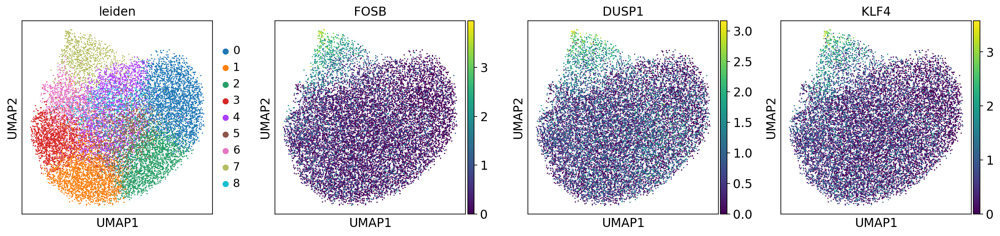

P4


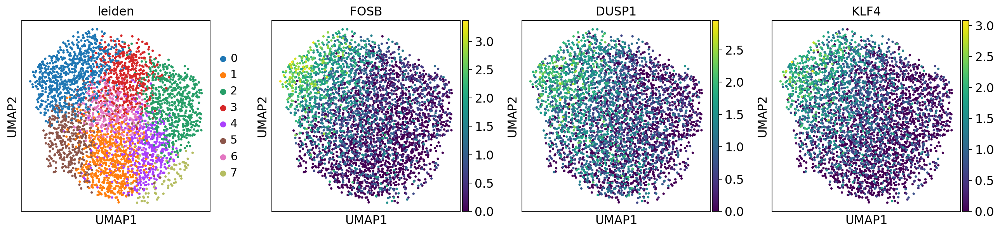

P5


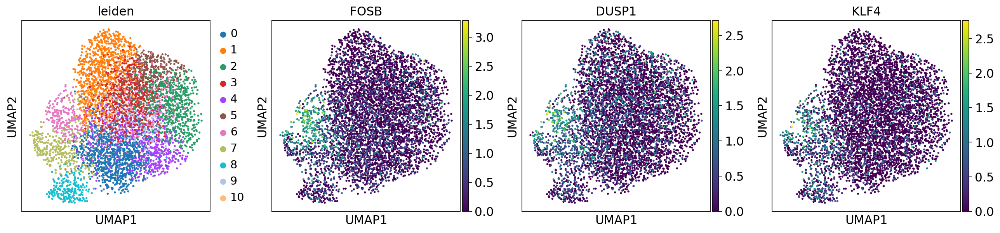

P6


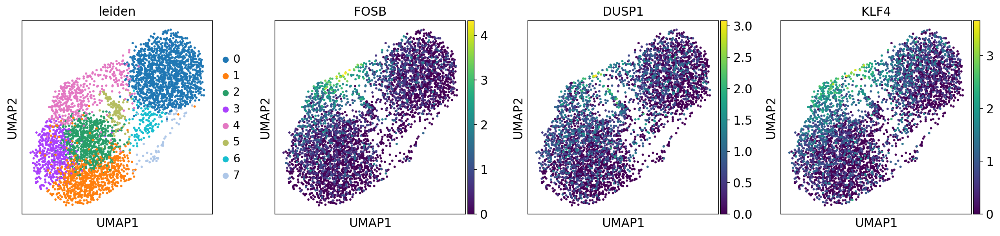

In [14]:
for tmp_patient, tmp_adata in patient_adatas.items():
    print(tmp_patient)
    sc.pl.umap(tmp_adata, color=["leiden", "FOSB", "DUSP1", "KLF4"])

In [15]:
# for each patient, the clusters that are FOS+ JUN+
fos_annotation = {"P1": [5], "P2": [9, 2], "P3": [8], "P4": [0], "P5": [9], "P6": [3]}

In [16]:
adata.obs["cell_phenotype"] = "malignant_b"
for tmp_patient, tmp_adata in patient_adatas.items():
    adata.obs.loc[
        tmp_adata[
            tmp_adata.obs["leiden"].isin([str(x) for x in fos_annotation[tmp_patient]])
        ].obs_names,
        "cell_phenotype",
    ] = "fos_malignant_b"

Trying to set attribute `.obs` of view, copying.


... storing 'cell_phenotype' as categorical


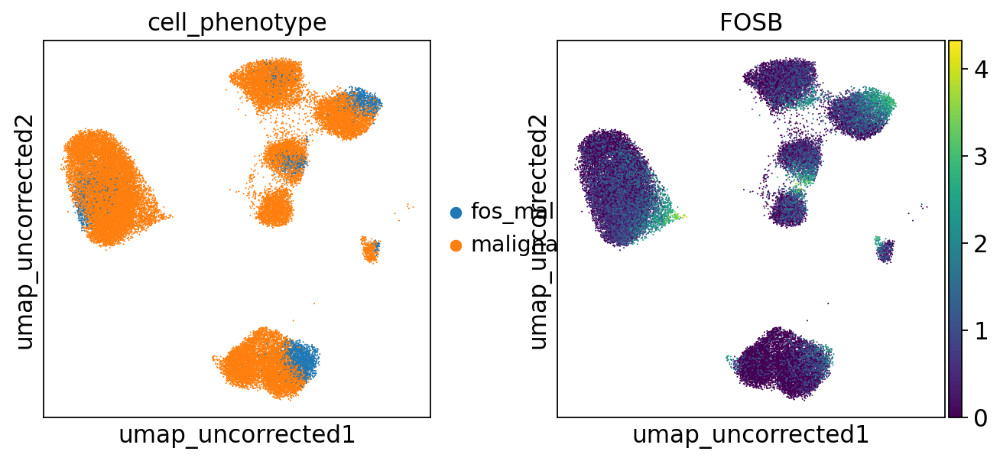

In [17]:
sc.pl.embedding(adata, "umap_uncorrected", color=["cell_phenotype", "FOSB"])

In [18]:
adata.write_h5ad("../../data/60_cluster_analysis/adata_malignant_b_cells.h5ad")

## Plot cluster abundance by timepoint

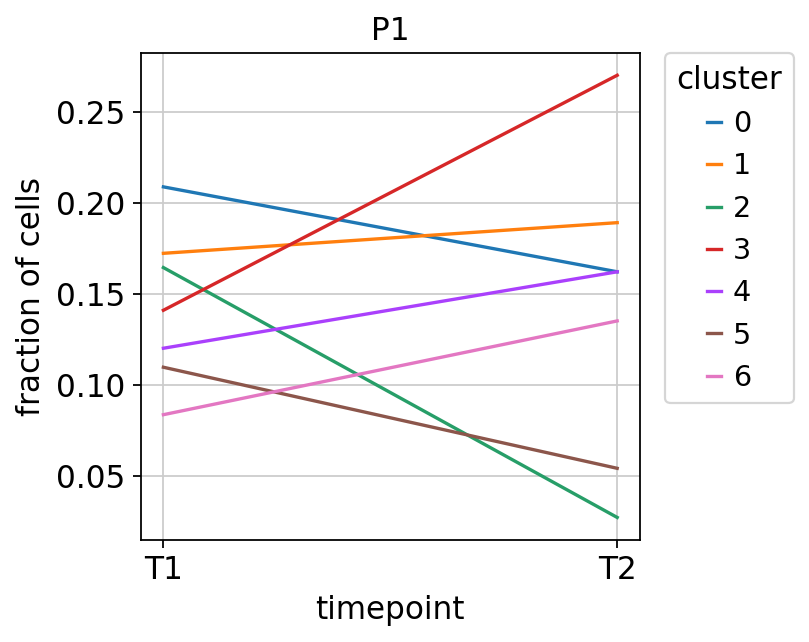

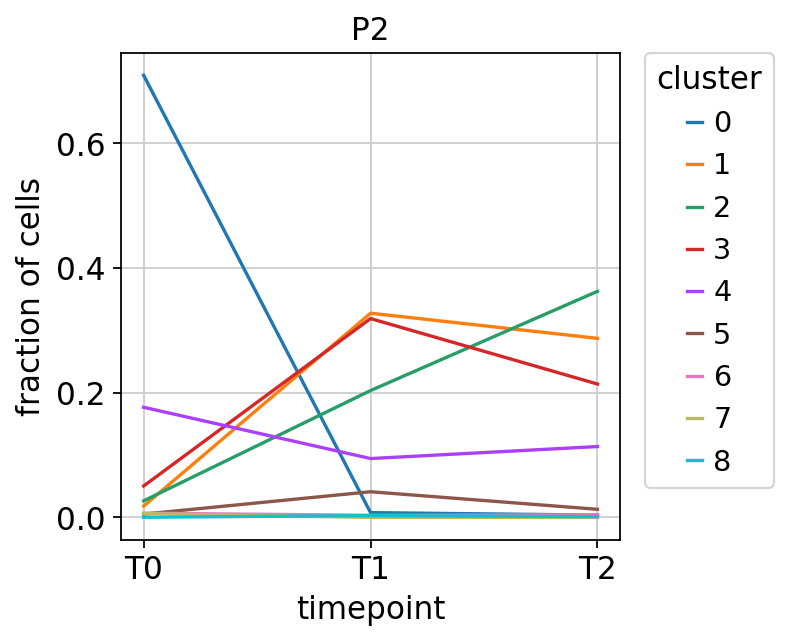

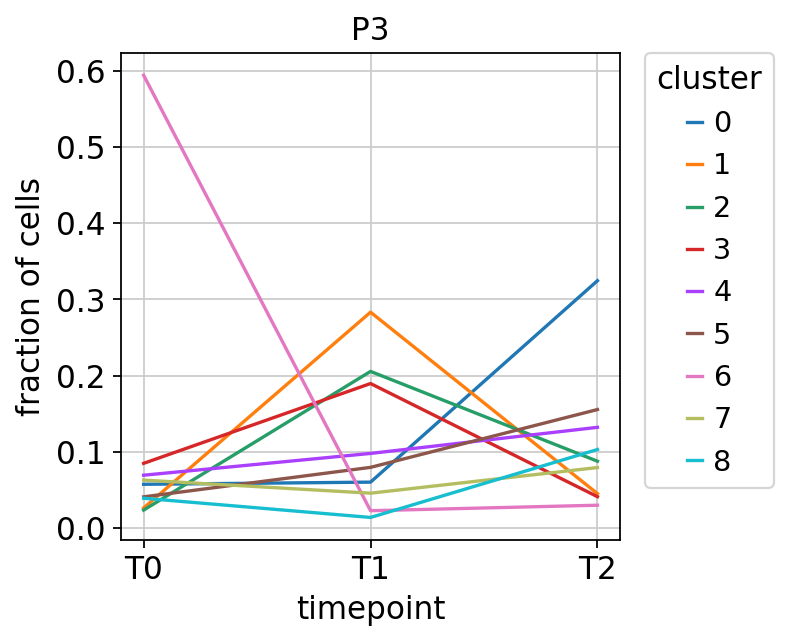

In [19]:
for patient in ["P1", "P2", "P3"]:
    cells_by_timepoint = (
        patient_adatas[patient]
        .obs.groupby(["timepoint", "leiden"])
        .size()
        .reset_index(name="n_cells")
        .groupby(["timepoint"])
        .apply(lambda df: df.assign(n_cells_per_timepoint=np.sum(df["n_cells"])))
        .pipe(
            lambda df: df.assign(frac_cells=df["n_cells"] / df["n_cells_per_timepoint"])
        )
    )
    ax = sns.lineplot(
        data=cells_by_timepoint, x="timepoint", y="frac_cells", hue="leiden"
    )
    plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.0, title="cluster")
    ax.set_ylabel("fraction of cells")
    ax.set_title(patient)
    plt.show()

In [20]:
import matplotlib.colors

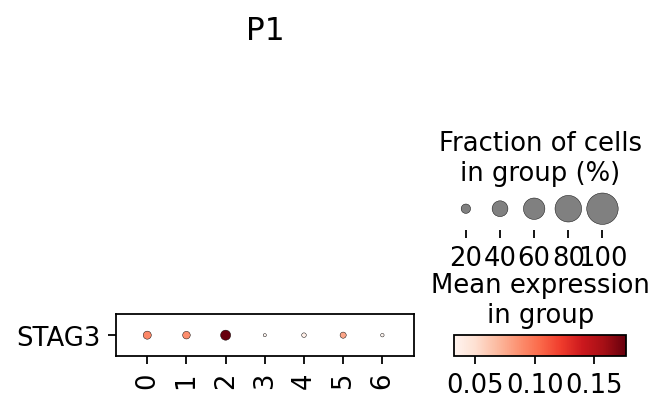

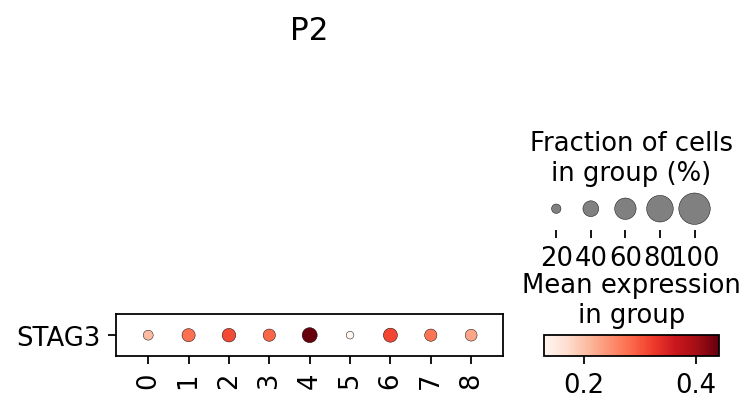

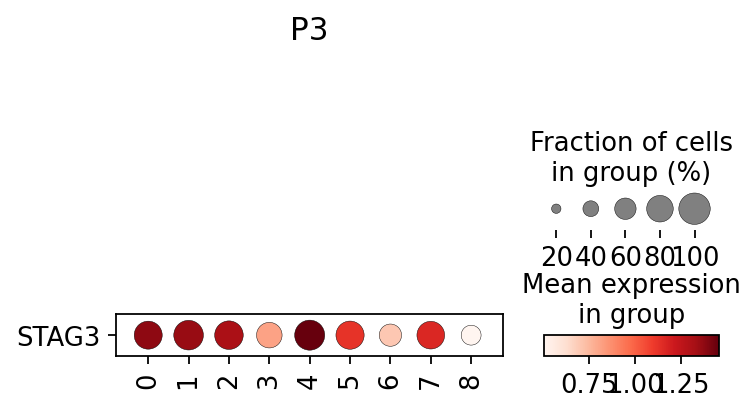

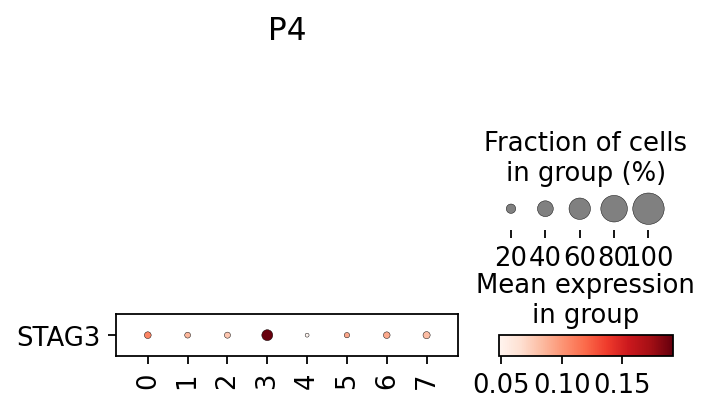

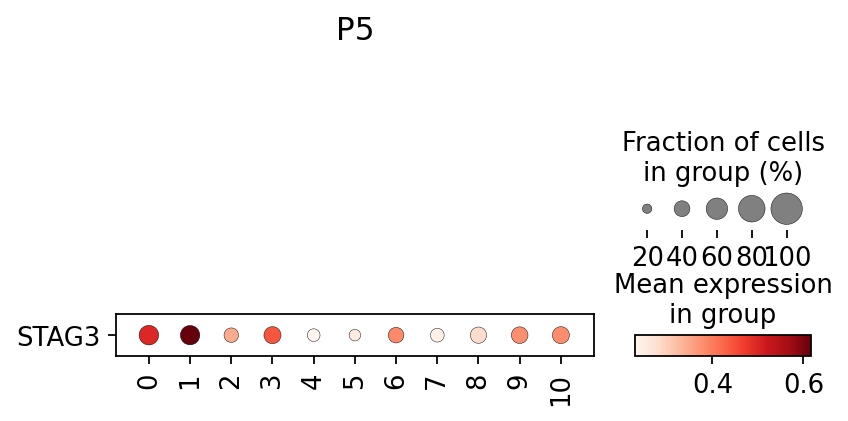

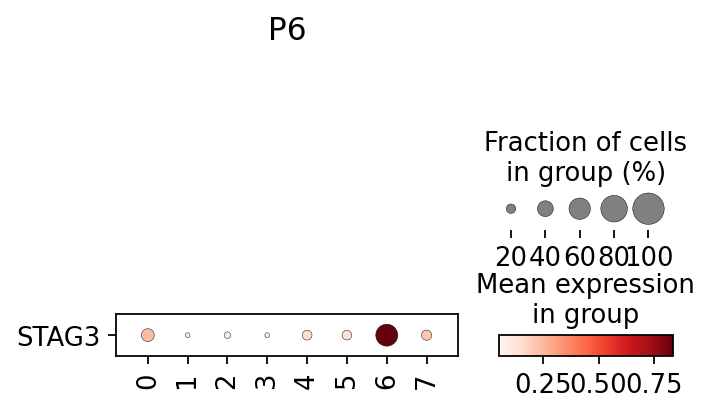

In [21]:
for patient, tmp_adata in patient_adatas.items():
    sc.pl.dotplot(tmp_adata, var_names=["STAG3"], groupby="leiden", dot_max=1, swap_axes=True, title=patient)